----
# <font size=10 color='sans'> <b> Project report  </b> </font> 
----
**Application of deep neural networks in multi-class classification of user reviews"**

Prepared by students Mamaev I.S. and Zhuravlev G.S. within the framework of the Additional Education Program "bonus_track".

To carry out the work, an array of reviews on the Amazon website in the "Electronics" section, left in the period from 1995 to 2015 [<sup/>1</sup>](https://s3.amazonaws.com/amazon-reviews-pds/tsv/index.txt). The analysis uses the 'review_text' and 'star_rating' columns to classify review texts into five grades from 1 to 5 based on the number of stars.
Data is freely available[<sup/>1</sup>](https://s3.amazonaws.com/amazon-reviews-pds/tsv/index.txt).

In [ ]:
import requests
import io
import gzip
import polars as pl
import pyarrow.parquet as pq

In [ ]:
url = 'https://s3.amazonaws.com/amazon-reviews-pds/tsv/'+ \
'amazon_reviews_us_Electronics_v1_00.tsv.gz'
response = requests.get(url)
reader = pl.read_csv(
    io.StringIO(gzip.decompress(response.content).decode('utf-8')),
    separator='\t',low_memory=False,
    ignore_errors=True,
    infer_schema_length=100000).drop('marketplace',
                                     'review_id',
                                     'product_parent',
                                     'product_category',
                                     'vine',
                                     'verified_purchase')

reader.write_parquet('/content/drive/MyDrive/Eletcronics',
                     compression='zstd',
                     compression_level=22)  
# save local

In [ ]:
data = pq.read_table('/content/drive/MyDrive/Electronics.parquet.zstd',
                     columns=['star_rating','review_body'])

In [ ]:
import string
data = data.sort_by([("review_body", "ascending")])
df = data.drop_null().to_pandas()
df = df.iloc[:-460]
df['review_body'] = [str(i).lower().translate(
    str.maketrans("", "",string.punctuation))for i in df['review_body']]
df

,star_rating,review_body
0,4,it works
1,4,
2,5,ӣ ð ...
3,2,im sure the mznh900s recording quality e...
4,5,thank you so much is very nice its fits my k...
...,...,...
3088402,5,thank you
3088403,5,thank you
3088404,5,thank you
3088405,5,thank you


In [ ]:
from google.colab.data_table import DataTable as dt
dt(df.iloc[:1707891])  # in colab it is interactive

,star_rating,review_body
0,5,i have had these for a few months now and they...
1,5,i have had these for a few months now and they...
2,4,i have had these for a few months now so heres...
3,5,i have had these for a few months now i bought...
4,5,i have had these for a few months now they are...
...,...,...
1707886,5,when i moved into my new house i was very exci...
1707887,5,when i moved into my new house and got my offi...
1707888,5,when i moved into my new house somehow my bose...
1707889,4,when i moved into my new place the previous ow...


In [ ]:
dat['review_body'] = [i.lower().replace('<br />',
                                        '') for i in dat['review_body']]

`Texthero` is a Python library that provides a simplified way to preprocess text data. It is built on top of `pandas` and `re` and provides a set of functions that can be easily applied to text data stored in a `DataFrame` object.
The library pre-processing module is used to remove numbers, HTML tags, stop words, punctuation marks, and extra spaces from text data. The resulting clean text is stored in the `clean_text` column.

stop words are the same as in `nltk.corpus.stopwords.words('english')`

In [ ]:
from texthero import preprocessing
import texthero as hero
dat['review_body'] = preprocessing.remove_digits(dat['review_body'],
                                                 only_blocks=False) # same ~ .str.replace(r"\d+", "", regex=True)
custom_pipeline = [preprocessing.remove_html_tags,
                   preprocessing.remove_stopwords,
                   preprocessing.remove_punctuation,
                   preprocessing.remove_whitespace, # same .str.replace("\xa0", " ", regex=False).str.split().str.join(" ")
                   preprocessing.fillna]
dat['clean_text'] = hero.clean(dat['review_body'],
                               custom_pipeline).drop_duplicates()

In [ ]:
dat.to_parquet('/content/drive/MyDrive/df.parquet.gzip',
               compression='gzip',engine='pyarrow')
# save clean dataset

In [ ]:
import pyarrow.parquet as pq
data = pq.read_table('df.parquet.gzip', columns=['star_rating','clean_text'])
dat = data.drop_null().to_pandas()  # after cleaning ~ 2,8E+6 rows

## Preprocessing

In [ ]:
import seaborn as sns
import pandas as pd
sns.set_style("whitegrid")
import altair as alt
import matplotlib.pyplot as plt

In [ ]:
bars = alt.Chart(dat).mark_bar(size=50).encode(
    x=alt.X('star_rating'),
    y=alt.Y('PercentOfTotal:Q', axis=alt.Axis(format='.0%', title='% of Review')),
    color='star_rating'
).transform_window(
    TotalArticles='sum(id)',
    frame=[None, None]
).transform_calculate(
    PercentOfTotal="datum.id / datum.TotalArticles"
)

text = bars.mark_text(
    align='center',
    baseline='bottom',
).encode(
    text=alt.Text('PercentOfTotal:Q', format='.1%')
)

(bars + text).interactive().properties(
    height=300, 
    width=700,
    title = "% of reviews in each category",
)

alt.LayerChart(...)

The resulting set contains a fair amount of positive reviews, which in the future it was decided to reduce the number of reviews with five stars, making it approximately equal to its number of reviews with four stars.

In [ ]:
df['length'] = df['clean_text'].str.len()
quantile_95 = df['length'].quantile(0.95)
df_95 = df[df['length'] < quantile_95]

In [ ]:
df1 = df.copy()
df1['id'] = 1
df2 = pd.DataFrame(df1.groupby('star_rating').count()['id']).reset_index()

Text(0.5, 1.0, 'Reviews length after cleaning')

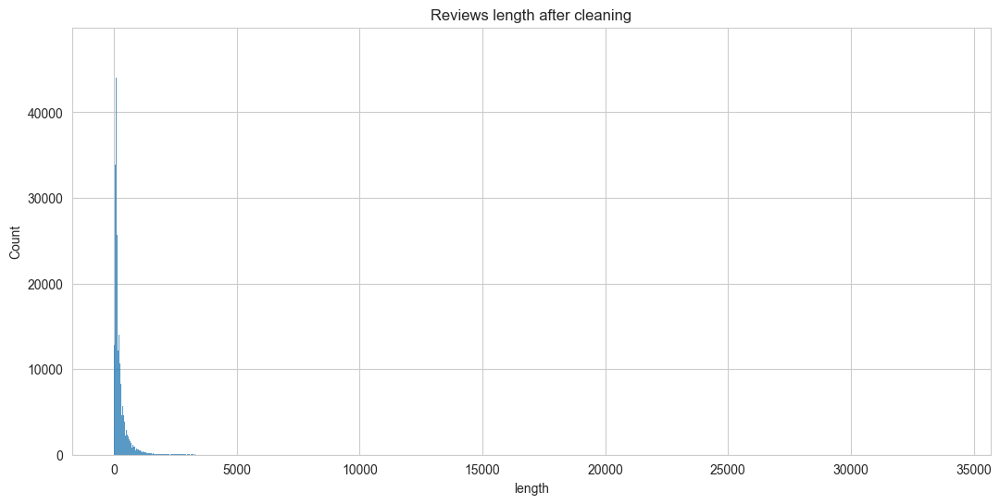

In [ ]:
df1['length'] = df1['clean_text'].str.len()
plt.figure(figsize=(12.8,6))
sns.histplot(df1['length']).set_title('Reviews length after cleaning')

<Axes: xlabel='star_rating', ylabel='length'>

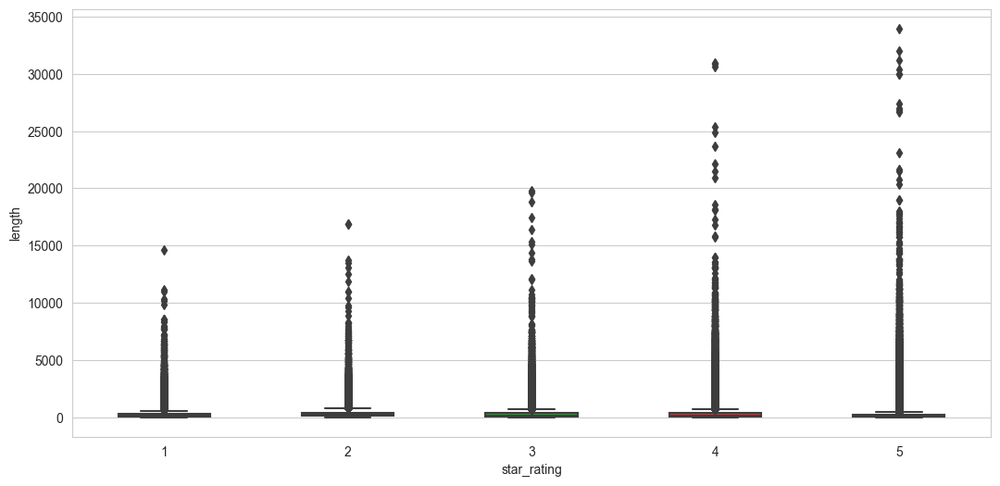

In [ ]:
plt.figure(figsize=(12.8,6))
sns.boxplot(data=df1, x='star_rating', y='length', width=.5)

C:\Users\home_note\AppData\Local\Temp\ipykernel_13008\665943445.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_95['length']).set_title('Reviews length distribut')


Text(0.5, 1.0, 'Reviews length distribut')

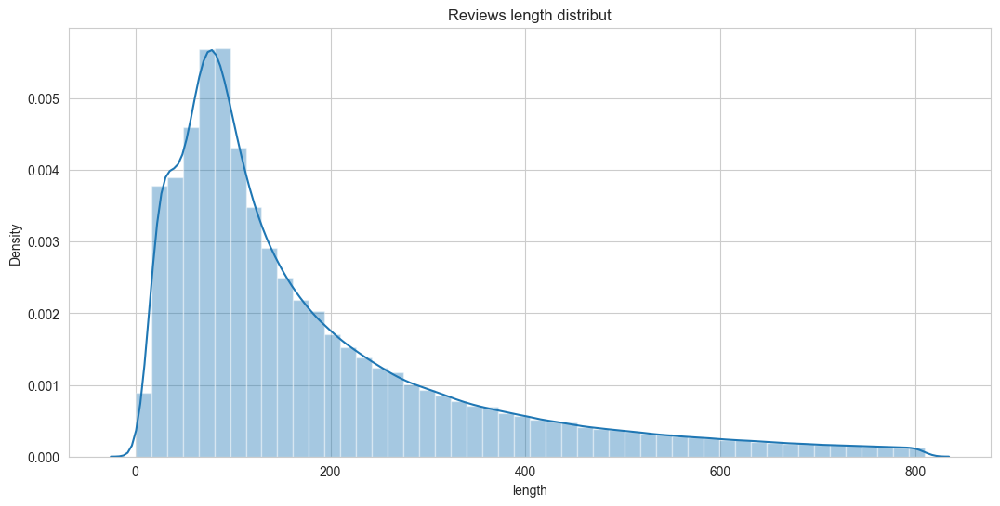

In [ ]:
quantile_95 = df1['length'].quantile(0.95)
df_95 = df1[df1['length'] < quantile_95]
plt.figure(figsize=(12.8,6))
sns.distplot(df_95['length']).set_title('Reviews length distribut')

<Axes: xlabel='star_rating', ylabel='length'>

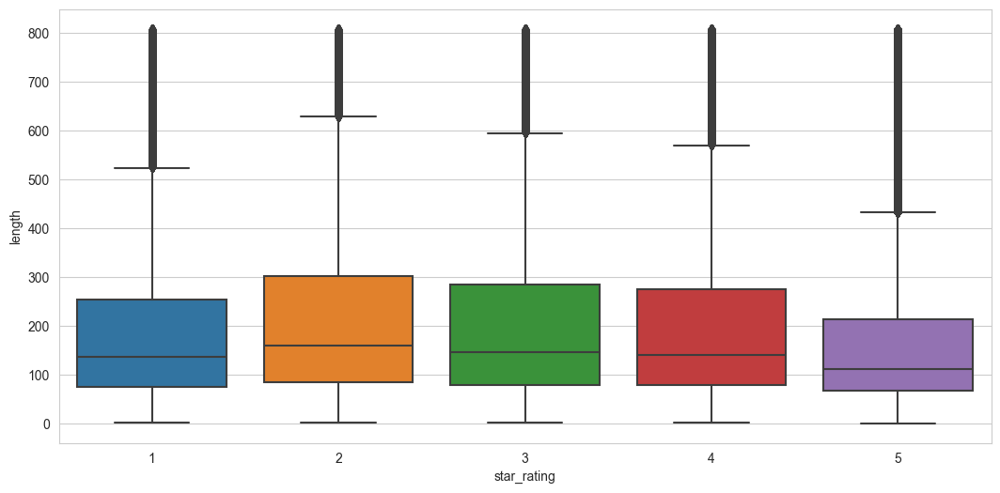

In [ ]:
plt.figure(figsize=(12.8,6))
sns.boxplot(data=df_95, x='star_rating', y='length')

In [ ]:
v_bad = hero.top_words(df1[df1['star_rating']==1]['clean_text'])[:15].to_dict()
bad = hero.top_words(df1[df1['star_rating']==2]['clean_text'])[:15].to_dict()
neitral = hero.top_words(df1[df1['star_rating']==3]['clean_text'])[:15].to_dict()
good = hero.top_words(df1[df1['star_rating']==4]['clean_text'])[:15].to_dict()
great = hero.top_words(df1[df1['star_rating']==5]['clean_text'])[:15].to_dict()

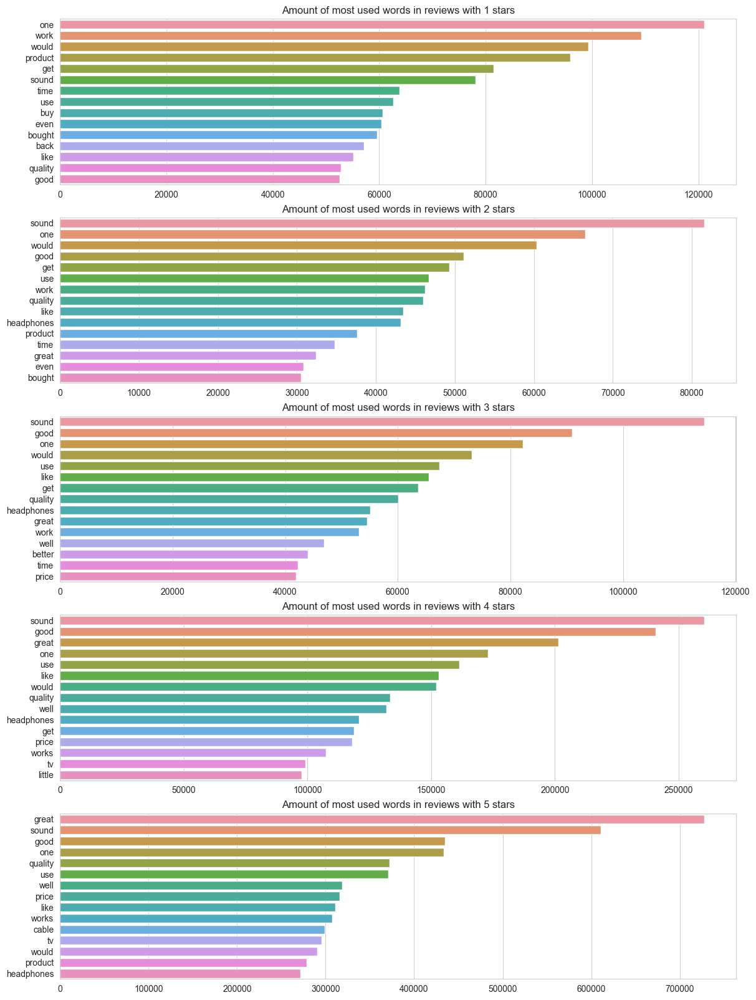

In [ ]:
plt.figure(figsize=(14, 20), dpi=100)
for _, i in enumerate([v_bad,bad,neitral,good,great]):
    plt.subplot(5, 1, _+1)
    sns.barplot(y=[k for k,v in i.items()],
                x=[v for k,v in i.items()]).set_title(
                    f'Amount of most used words in reviews with {_+1} stars')
plt.show()




---


## Building and training models


---



The following architectures of multilayer neural networks were considered:
1. With a simplified `EmbeddingBag` nesting layer, with weights triggered from a pre-trained model.
2. A multilayer network containing a convolutional layer and with predefined weights in the `EmbeddingBag` layer.
3. Two recurrent network models, based on `LSTM`, which applies a multi-level long-term short-term memory (LSTM) RNN to the input sequence.

Basically, in the future, for vectorization, we consider:
- Integer encoding
    
     - `one-hot encoding` To represent each word, create a null vector with a length equal to the vocabulary, and place a one in the index corresponding to the word.
     - a unique number for each word, which is effective for a large vocabulary.
However, this approach has two disadvantages:
   - Integer encoding is arbitrary (it does not capture any relationship between words).
   - Integer encoding can be difficult to interpret the model.

- Word Embeddings
     - Word embedding gives us a way to use an efficient, dense representation where similar words have a similar encoding. The nesting is a dense vector of floating point values. Instead of manually specifying values to embed, they are learnable parameters.
     - Simplified use of word embedding, via the `Embedding` layer. The Embedding layer can be understood as a lookup table that maps integer indices to dense vectors (their embeddings).

### Network 1
`PyTorch`

In [ ]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
df_95 = df_95.sort_values(by='star_rating')

In [ ]:
df_95 = df_95[:-1047000] 

In [ ]:
df_95.star_rating.value_counts()

5    464790
4    463442
1    330990
3    213237
2    163813
Name: star_rating, dtype: int64

In [ ]:
df

,star_rating,clean_text
0,3,bought stuff looks nice sturdy please care...
1,3,bad ordered shelfs last months shelf dvd ...
2,5,hdmi inputs know caught researching item c...
3,5,cable cable say well one surpasses ordinar...
4,5,cable cable long supposed usually used arg...
...,...,...
2842165,1,zvox serial number defective optical input hap...
2842166,5,zvox simple sounds detailed clean samsung r no...
2842167,5,zvox three low profile z base speaker systems...
2842168,1,zvue returned customer service non responsive ...


In [ ]:
from sklearn.model_selection import train_test_split

df_95.star_rating = [x-1 for x in df_95.star_rating] 
train, test = train_test_split(df_95, test_size=0.3)

#### Creating a data packet for transmission to the network and an iterator

`torch.utils.data.DataLoader` operates on a `map` style dataset that implements the `getitem()` and `len()` and maps indexes/keys to data samples. It also works on an iterable set of data.

Before being sent to the model, the `collate_fn` function processes the text entries of the original batch input, packed into a list and combined into a single tensor for input to the `EmbeddingBag` layer. `offset` is a separator tensor to represent the starting index of a single sequence in the text tensor. `Label` is a tensor that stores the labels of individual text entries.

In [ ]:
data_ = list(df_95.itertuples(index=False, name=None))
train_ = list(train.itertuples(index=False, name=None))
test_ = list(test.itertuples(index=False, name=None))

In [ ]:
from torch.utils.data import DataLoader


def collate_batch(batch):
    label_list, text_list, offsets = [], [], [0]
    for (_label, _text) in batch:
         label_list.append(label_pipeline(_label))
         processed_text = torch.tensor(text_pipeline(_text), dtype=torch.int64)
         text_list.append(processed_text)
         offsets.append(processed_text.size(0))
    label_list = torch.tensor(label_list, dtype=torch.int64)
    offsets = torch.tensor(offsets[:-1]).cumsum(dim=0)
    text_list = torch.cat(text_list)
    return label_list.to(device), text_list.to(device), offsets.to(device)

In [ ]:
from torchtext.data.utils import get_tokenizer
from torchtext.vocab import build_vocab_from_iterator
from torch.utils.data import DataLoader

tokenizer = get_tokenizer('basic_english')
train_iter = iter(data_)


def yield_tokens(data_iter):
    for _, text in data_iter:
        yield tokenizer(text)


vocab = build_vocab_from_iterator(yield_tokens(train_iter), specials=["<unk>"])
vocab.set_default_index(vocab["<unk>"])
text_pipeline = lambda x: vocab(tokenizer(x))
label_pipeline = lambda x: int(x) + 1

In [ ]:
!wget http://nlp.stanford.edu/data/glove.6B.zip
!unzip glove*.zip

#### Load weights from pre-trained model
The file `glove.6B.300d.txt` is part of the GloVe (Global Vectors for Word Representation) word embedding model, which is an unsupervised learning algorithm developed by researchers at Stanford University. The algorithm generates word embeddings by aggregating global word matching matrices from a given corpus. The basic idea behind word embeddings in GloVe is to infer the relationship between words from statistics[<sup/>3</sup>](https://analyticsindiamag.com/hands-on-guide-to-word-embeddings-using-glove/).

In [ ]:
import numpy as np
print('Indexing word vectors.')
vocab_size = len(vocab)
embeddings_index = {}
f = open('glove.6B.300d.txt', encoding='utf-8')
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

print('Found %s word vectors.' % len(embeddings_index))

Indexing word vectors.
Found 400000 word vectors.


In [ ]:
embed_dim = 300

# Prepare embedding matrix from pre-trained model
embedding_matrix = np.zeros((vocab_size, embed_dim))
for i,word in enumerate(vocab.get_itos()):
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # words not found in embedding index will be all-zeros.
        embedding_matrix[i] = embedding_vector

# Check % words with embeddings 
nonzero_elements = np.count_nonzero(np.count_nonzero(embedding_matrix, axis=1))
print(nonzero_elements / vocab_size)

0.3245501285347044


In [ ]:
embedding_matrix = torch.tensor(embedding_matrix).float().to(device)

In [ ]:
#@title Building model
from torch import nn

class TextClassificationModel(nn.Module):

    def __init__(self, vocab_size, embed_dim, num_class):
        super(TextClassificationModel, self).__init__()
        self.embedding = nn.EmbeddingBag(vocab_size, embed_dim, sparse=False,
                                         _weight=embedding_matrix)
        self.fc = nn.Linear(embed_dim, num_class)
        self.init_weights()

    def init_weights(self):
        initrange = 0.5
        self.fc.weight.data.uniform_(-initrange, initrange)
        self.fc.bias.data.zero_()

    def forward(self, text, offsets):
        embedded = self.embedding(text, offsets)
        return self.fc(embedded)

* `TextClassificationModel` defines a neural network for text classification using nesting, pooling of averages and line layer. It takes a sequence of words, converts them to embeddings, uses a pool of averages to get a fixed length representation of the sequence, and runs that representation through the line level to get the logs for each class. \
Also, since `nn.EmbeddingBag` accumulates the average value for embeddings on the fly, nn.EmbeddingBag can improve performance and memory efficiency for processing the tensor sequence,
the weights for this layer are given by the `embedding_matrix` matrix, which is a pre-initialized weight matrix derived from a pre-trained model [<sup/>3</sup>](https://analyticsindiamag.com/hands-on-guide-to-word-embeddings-using-glove/) which is used to embed vectors of words (file glove.6B.300d.txt) associated with an existing dictionary.

In [ ]:
train_iter = iter(train_)
num_class = len(set([label for (label, text) in train_iter]))
vocab_size = len(vocab)
emsize = 64
print(f'Vocab size {vocab_size}\nAmount of classes {num_class}')

Vocab size 213172
Amount of classes 5


In [ ]:
model = TextClassificationModel(vocab_size, 300, num_class).to(device)
model

TextClassificationModel(
  (embedding): EmbeddingBag(213172, 300, mode='mean')
  (fc): Linear(in_features=300, out_features=5, bias=True)
)

In [ ]:
import time

def train(dataloader):
    model.train()
    total_acc, total_count = 0, 0
    log_interval = 500
    start_time = time.time()

    for idx, (label, text, offsets) in enumerate(dataloader):
        optimizer.zero_grad()
        predicted_label = model(text, offsets)
        loss = criterion(predicted_label, label)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 0.1)
        optimizer.step()
        total_acc += (predicted_label.argmax(1) == label).sum().item()
        total_count += label.size(0)
        if idx % log_interval == 0 and idx > 0:
            elapsed = time.time() - start_time
            print('| epoch {:3d} | {:5d}/{:5d} batches '
                  '| accuracy {:8.3f}'.format(epoch, idx, len(dataloader),
                                              total_acc/total_count))
            total_acc, total_count = 0, 0
            start_time = time.time()

def evaluate(dataloader):
    model.eval()
    total_acc, total_count = 0, 0

    with torch.no_grad():
        for idx, (label, text, offsets) in enumerate(dataloader):
            predicted_label = model(text, offsets)
            loss = criterion(predicted_label, label)
            total_acc += (predicted_label.argmax(1) == label).sum().item()
            total_count += label.size(0)
    return total_acc/total_count

In [ ]:
text_pipeline('here is the an example')

[0, 0, 0, 0, 1468]

In [ ]:
import gc # rubish collecter
gc.collect()

2441

In [ ]:
from torch.utils.data.dataset import random_split
from torchtext.data.functional import to_map_style_dataset
# Hyperparameters
EPOCHS = 10 # epoch
LR = 5  # learning rate
BATCH_SIZE = 64 # batch size for training

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 1.0, gamma=0.1)
total_accu = None
train_iter = iter(train_)
test_iter = iter(test_)
train_dataset = to_map_style_dataset(train_iter)
test_dataset = to_map_style_dataset(test_iter)
num_train = int(len(train_dataset) * 0.95)
split_train_, split_valid_ = \
    random_split(train_dataset, [num_train, len(train_dataset) - num_train])

train_dataloader = DataLoader(split_train_, batch_size=BATCH_SIZE,
                              shuffle=True, collate_fn=collate_batch)
valid_dataloader = DataLoader(split_valid_, batch_size=BATCH_SIZE,
                              shuffle=True, collate_fn=collate_batch)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE,
                             shuffle=True, collate_fn=collate_batch)

In [ ]:
split_train_[2]

(4, 'works great old albums  turntable anymore needed')

In [ ]:
next(iter(train_dataloader))

(tensor([4, 0, 4, 0, 4, 4, 2, 4, 4, 2, 3, 3, 3, 0, 0, 0, 2, 3, 0, 2, 3, 0, 0, 3,
         1, 0, 0, 1, 1, 3, 3, 1, 1, 0, 4, 3, 0, 3, 1, 3, 3, 3, 1, 3, 0, 1, 2, 1,
         4, 2, 4, 0, 4, 4, 0, 1, 0, 2, 3, 4, 2, 4, 4, 3]),
 tensor([ 223,  198,  573,  ..., 1380,  303,   18]),
 tensor([   0,    5,  106,  122,  133,  142,  154,  194,  201,  245,  266,  276,
          282,  299,  310,  320,  360,  387,  403,  419,  486,  494,  508,  541,
          561,  566,  612,  615,  618,  718,  773,  792,  819,  832,  842,  863,
          917,  984, 1049, 1065, 1111, 1176, 1183, 1198, 1274, 1293, 1312, 1363,
         1456, 1476, 1487, 1503, 1519, 1527, 1531, 1567, 1581, 1625, 1640, 1650,
         1655, 1675, 1712, 1740]))

In [ ]:
#@title Обучение {display-mode: "form"}
for epoch in range(1, EPOCHS + 1):
    epoch_start_time = time.time()
    train(train_dataloader)
    accu_val = evaluate(valid_dataloader)
    if total_accu is not None and total_accu > accu_val:
      scheduler.step()
    else:
       total_accu = accu_val
    print('-' * 59)
    print('| end of epoch {:3d} | time: {:5.2f}s | '
          'valid accuracy {:8.3f} '.format(epoch,
                                           time.time() - epoch_start_time,
                                           accu_val))
    print('-' * 59)

| epoch   1 |   500/11902 batches | accuracy    0.530
| epoch   1 |  1000/11902 batches | accuracy    0.539
| epoch   1 |  1500/11902 batches | accuracy    0.543
| epoch   1 |  2000/11902 batches | accuracy    0.550
| epoch   1 |  2500/11902 batches | accuracy    0.547
| epoch   1 |  3000/11902 batches | accuracy    0.547
| epoch   1 |  3500/11902 batches | accuracy    0.549
| epoch   1 |  4000/11902 batches | accuracy    0.550
| epoch   1 |  4500/11902 batches | accuracy    0.556
| epoch   1 |  5000/11902 batches | accuracy    0.555
| epoch   1 |  5500/11902 batches | accuracy    0.551
| epoch   1 |  6000/11902 batches | accuracy    0.552
| epoch   1 |  6500/11902 batches | accuracy    0.557
| epoch   1 |  7000/11902 batches | accuracy    0.553
| epoch   1 |  7500/11902 batches | accuracy    0.558
| epoch   1 |  8000/11902 batches | accuracy    0.558
| epoch   1 |  8500/11902 batches | accuracy    0.557
| epoch   1 |  9000/11902 batches | accuracy    0.554
| epoch   1 |  9500/11902 ba

In [ ]:
torch.save(model,'model_0_57_not_dict')

In [ ]:
#@title Results {display-mode: "form"}
pr = []
la = []
model.eval()
with torch.no_grad():
    for i, (lab, tex, off) in enumerate(test_dataloader):
        la.append(lab)
        pr.append(model(tex,off).argmax(1))

In [ ]:
pr_test = np.concatenate([i.cpu().numpy() for i in pr])
lab_test = np.concatenate([i.cpu().numpy() for i in la])

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(lab_test, pr_test))

              precision    recall  f1-score   support

           0       0.63      0.81      0.71     69576
           1       0.36      0.11      0.17     34236
           2       0.39      0.22      0.28     44957
           3       0.52      0.61      0.56     97428
           4       0.66      0.69      0.68     97420

    accuracy                           0.58    343617
   macro avg       0.51      0.49      0.48    343617
weighted avg       0.55      0.58      0.55    343617



The output value from five neurons is correlated by the maximum value, shows the relation to a particular class.
The F1 score is a measure of accuracy used for classification systems. It combines the `precision` and `recall` of the model and is defined as the harmonic mean of these two values.

In [ ]:
%pip install scikit-plot -q

Note: you may need to restart the kernel to use updated packages.


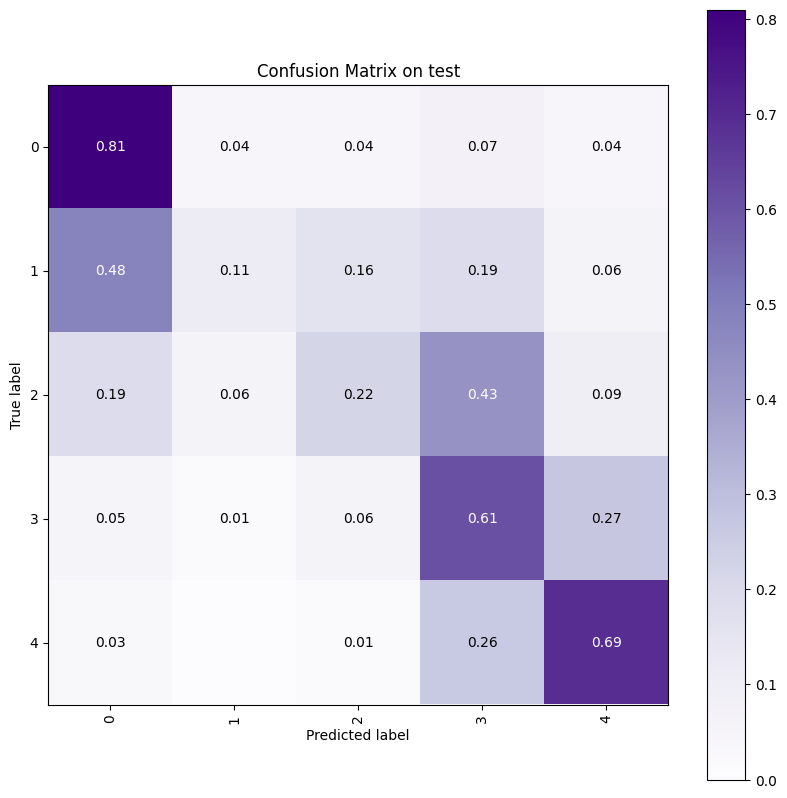

In [ ]:
import scikitplot as skplt
import matplotlib.pyplot as plt

skplt.metrics.plot_confusion_matrix(lab_test, pr_test,
                                    normalize=True,
                                    title="Confusion Matrix on test",
                                    cmap="Purples",
                                    hide_zeros=True,
                                    figsize=(10,10)
                                    )
plt.xticks(rotation=90)
plt.show()

The cells indicate the `recall` metric, which measures the proportion of actual positive results that are correctly identified by the model. It is calculated as the ratio of true positives to the sum of true positives and false negatives. Accordingly, the model does not cope well with the classification of 2 and 3 star reviews.

In [ ]:
#@title Test on new random review
review_label = {1: "Very Bad",
                2: "Bad",
                3: "Neitral",
                4: "Good",
                5: "Great"}

def predict(text, text_pipeline):
    with torch.no_grad():
        text = torch.tensor(text_pipeline(text))
        output = model(text, torch.tensor([0]))
        return output.argmax(1).item() + 1


ex_text_str = "i have listened to practically every boombox available on \
 the market and this boombox is the best ive heard  when you turn up the volume \
 close to its maximum the sound is still clean not distorted and scratchy \
 like most  boomboxes  most boomboxes have some sort of feature which enhances \
 the  bass and low frequency midrange notes  this boombox instead of a \
 onebutton quotall or nothingquot bass enhancement has a variable bass \
 enhancement feature it has six levels to choose from and each level is \
 distinctly more powerful than the previous level  i am 100 totally \
 satisfied with this product"
# 5
model = model.to("cpu")

print("This is a %s review" %review_label[predict(ex_text_str, text_pipeline)])

This is a Great review


In [ ]:
tex_1 = 'i prefer christmas videos and music but i usually read \
 andor inquire about the material  whatever it is  before i purchase \
 it inevitably sales for this particular dvd would increase if more \
 particulars were given bad regarding its contents shame'  # 1
print("This is a %s review" %review_label[predict(tex_1, text_pipeline)])

This is a Very Bad review


----
Based on the performance of this model from the Confusion Matrix presented above, we can say that the model copes well with reviews of 5 and 1 one star, which cannot be said about the rest. After 10 epochs, with the optimal optimizer and loss function chosen, in our opinion, with others, finding the minimum seems to be a more difficult process.

### Network 2 `CNN`
`tensorflow`

#### Prepearing

In [ ]:
from sklearn.model_selection import train_test_split
import pyarrow.parquet as pq
import tensorflow as tf


data = pq.read_table('/content/drive/MyDrive/Colab Notebooks/ML'+
                     '/Bonus_track/df.parquet.gzip',
                     columns=['star_rating','clean_text'])
df = data.drop_null().to_pandas()
df['length'] = df['clean_text'].str.len()
quantile_9 = df['length'].quantile(0.9)
df_9 = df[df['length'] < quantile_9]
df_9 = df_9.sort_values(by='star_rating')
df_9 = df_9.drop(columns='length')

In [ ]:
from torch import device, cuda
device = device("cuda" if cuda.is_available() else "cpu")

In [ ]:
df_9.star_rating.value_counts()

star_rating
5    1446278
4     431273
1     314138
3     198064
2     151587
Name: count, dtype: int64

In [ ]:
df_9 = df_9.iloc[:1526278]

In [ ]:
df_9.star_rating.value_counts()

4    431273
5    431216
1    314138
3    198064
2    151587
Name: star_rating, dtype: int64

In [ ]:
df_9

,star_rating,clean_text
1337646,1,would say stars glue holding together falling...
2258375,1,adapter work sony vaio duo svd x tip long ad...
260115,1,really buy perhaps give away certainly
2258377,1,adapter work switzerland tried use adapter d...
2258378,1,adapter work sydney australia harbour marriot...
...,...,...
2663049,5,say fit works appears defects complaints far
2663050,5,say fits everything need connect including sp...
2663051,5,say fits well works use replacement adapter ...
2663052,5,say foam pad ear covers made quality materia...


#### Tokenization

In [ ]:
df_9 = df_9.reset_index().drop(columns='index')
data_ = list(df_9.itertuples(index=False, name=None))

In [ ]:
import numpy as np
from tensorflow.keras.layers import Conv1D, Dense, Embedding, Flatten, Input, MaxPooling1D
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.metrics import categorical_accuracy
from tensorflow.keras.utils import to_categorical

In [ ]:
tokenizer = Tokenizer() # Setup tokenizer
tokenizer.fit_on_texts(df_9.clean_text.to_list())
sequences = tokenizer.texts_to_sequences(df_9.clean_text.to_list())

In [ ]:
print (tokenizer.texts_to_sequences(['Hi, here is an example .']))
print (len(sequences))
word_index = tokenizer.word_index
print('Found {:,} unique words.'.format(len(word_index)))

[[1694, 1690]]
1526278
Found 186,802 unique words.


In [ ]:
avg = sum(map(len, sequences)) / len(sequences)
std = np.sqrt(sum(map(lambda x: (len(x) - avg)**2, sequences)) / len(sequences))
print(f'Average of text lenght {avg}\nStd of lenght {std}')

Average of text lenght 23.981541370576004
Std of lenght 17.84285424066969


In [ ]:
data = pad_sequences(sequences, maxlen=300)

In [ ]:
labels = to_categorical(np.asarray(df_9.star_rating.to_list()))

In [ ]:
embeddings_index = {} # We create a dictionary of word -> embedding

with tf.device('GPU'):
  with open('/content/drive/MyDrive/glove.6B.300d.txt') as f:
    for line in f:
        values = line.split()
        word = values[0] # The first value is the word, the rest are the values of the embedding
        embedding = np.asarray(values[1:], dtype='float32') # Load embedding
        embeddings_index[word] = embedding # Add embedding to our embedding dictionary

print('Found {:,} word vectors in GloVe.'.format(len(embeddings_index)))

Found 400,000 word vectors in GloVe.


In [ ]:
embedding_dim = 300
word_index = tokenizer.word_index
vocab_size = len(word_index)
nb_words = min(vocab_size, len(word_index)) # How many words are there actually
embedding_matrix = np.zeros((nb_words, embedding_dim))
# The vectors need to be in the same position as their index. 
for word, i in word_index.items():
    if i >= vocab_size: 
        continue
    # Get the embedding vector for the word
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None: 
        embedding_matrix[i] = embedding_vector
nonzero_elements = np.count_nonzero(np.count_nonzero(embedding_matrix, axis=1))
print(nonzero_elements / vocab_size)

0.343406387511911


In [ ]:
pad_train = pad_sequences(tokenizer.texts_to_sequences(train_), maxlen=300)

#### CNN model

The multilayer neural convolutional network [<sup/>4</sup>](https://arxiv.org/abs/1510.03820) includes the following layers [<sup/>5</sup>](https://arxiv.org/abs/1706.03762)
1. The first layer is the Embedding layer, which is used to convert the input text data into vectors. It accepts the following parameters:
     - `vocab_size`: size of the input text dictionary.
     - `embedding_dim`: dimension of the output space.
     - `input_length`: length of input sequences.
     - `weights`: pre-trained weights to load into the layer.
     - "teachable": whether the weights of this layer can be updated during training.
2. The next three layers are `Conv1D` layers, which are used for 1D convolutional neural networks. Each layer has the following options:
     - `filters`: number of output filters in the convolution.
     - `kernel_size`: 1D convolution window length.
     - `activation`: the activation function to use.
3. After each `Conv1D` layer, a `MaxPooling1D` layer is added. This layer performs the maximum data pooling operation.
4. After the last `MaxPooling1D` layer, a `Flatten` layer is added to convert the output 3D tensor to a 2D output tensor.
5. Two fully connected `Dense` layers are added after the `Flatten` layer. Each of which has the following options:
     - `units`: number of neurons in the layer.
     - `activation`: the activation function to use.
6. The last dense layer has 5 units, which corresponds to the number of classes in the output. The activation function used is `softmax`, which is used for classification tasks of several classes; at the output, the maximum value of one of the five neurons is a probabilistic characteristic of assignment to a particular class.

In [ ]:
model = Sequential()
model.add(Embedding(vocab_size, 
                    embedding_dim, 
                    input_length=300, 
                    weights = [embedding_matrix], 
                    trainable = False))
model.add(Conv1D(128, 3, activation='relu'))
model.add(MaxPooling1D(3))
model.add(Conv1D(128, 3, activation='relu'))
model.add(MaxPooling1D(3))
model.add(Conv1D(128, 3, activation='relu'))
model.add(MaxPooling1D(3))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(5, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 300, 300)          56040600  
                                                                 
 conv1d (Conv1D)             (None, 298, 128)          115328    
                                                                 
 max_pooling1d (MaxPooling1D  (None, 99, 128)          0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 97, 128)           49280     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 32, 128)          0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 30, 128)           4

In [ ]:
print (tokenizer.texts_to_sequences(['Hi, here is an example .']))
word_index = tokenizer.word_index
print('Found {:,} unique words.'.format(len(word_index)))

[[1694, 1690]]
Found 186,802 unique words.


In [ ]:
model.compile(loss='crossentropy', optimizer='adam',
              metrics=[categorical_accuracy])

In [ ]:
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
df_9.star_rating = [int(x)-1 for x in df_9.star_rating]
train, test = train_test_split(df_9, test_size=0.3)
train, val = train_test_split(train, test_size=0.2)
train_ = np.asarray(train.clean_text.to_list())
train_l = to_categorical(np.asarray(train.star_rating.to_list()))
test_ = np.asarray(test.clean_text.to_list())
test_l = np.asarray(test.star_rating.to_list())
val_ = np.asarray(val.clean_text.to_list())
val_l = to_categorical(np.asarray(val.star_rating.to_list()))

In [ ]:
import tensorflow as tf
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
with tf.device('GPU'): 
  pad_train = pad_sequences(tokenizer.texts_to_sequences(train_), maxlen=300)
  pad_val = pad_sequences(tokenizer.texts_to_sequences(val_), maxlen=300)

#### Training

In [ ]:
with tf.device('GPU'): 
    history = model.fit(pad_train, train_l, epochs=5, validation_data=(pad_val, val_l))

Epoch 1/5
26710/26710 [==============================] - 172s 6ms/step - loss: 0.3664 - categorical_accuracy: 0.5462 - val_loss: 0.3559 - val_categorical_accuracy: 0.5613
Epoch 2/5
26710/26710 [==============================] - 172s 6ms/step - loss: 0.3501 - categorical_accuracy: 0.5701 - val_loss: 0.3529 - val_categorical_accuracy: 0.5667
Epoch 3/5
26710/26710 [==============================] - 170s 6ms/step - loss: 0.3437 - categorical_accuracy: 0.5786 - val_loss: 0.3534 - val_categorical_accuracy: 0.5681
Epoch 4/5
26710/26710 [==============================] - 170s 6ms/step - loss: 0.3392 - categorical_accuracy: 0.5846 - val_loss: 0.3494 - val_categorical_accuracy: 0.5696
Epoch 5/5
26710/26710 [==============================] - 169s 6ms/step - loss: 0.3358 - categorical_accuracy: 0.5899 - val_loss: 0.3512 - val_categorical_accuracy: 0.5708


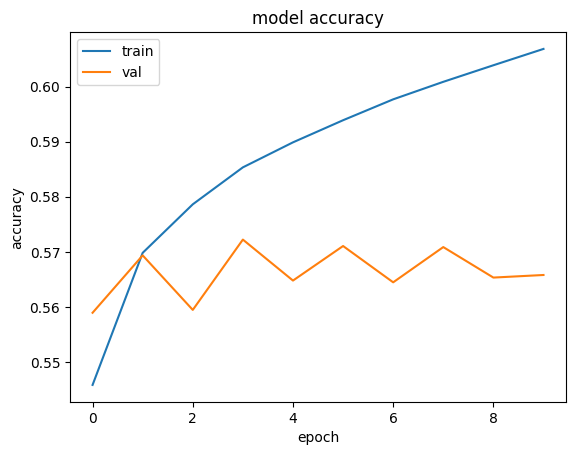

In [ ]:
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

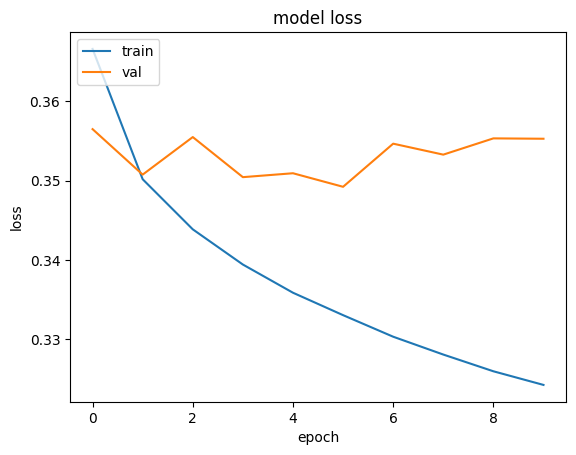

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
model.save_weights('/content/drive/MyDrive/Colab Notebooks/ML/Bonus_track/tf_cnn_checkpoint', save_format='h5')
model.save('/content/drive/MyDrive/Colab Notebooks/ML/Bonus_track/cnn_05_tf')

In [ ]:
from sklearn.metrics import accuracy_score, classification_report
with tf.device('GPU'):
    test_preds = model.predict(pad_sequences(tokenizer.texts_to_sequences(test_), maxlen=300))

14309/14309 [==============================] - 36s 2ms/step


In [ ]:
print("Test  Accuracy : {}".format(accuracy_score(test_l, np.argmax(test_preds, axis=1))))
print(classification_report(test_l, np.argmax(test_preds, axis=1)))

Test  Accuracy : 0.5656345275222545
              precision    recall  f1-score   support

           0       0.60      0.71      0.65     94315
           1       0.35      0.09      0.14     45434
           2       0.36      0.27      0.31     59500
           3       0.58      0.52      0.55    128945
           4       0.60      0.80      0.69    129690

    accuracy                           0.57    457884
   macro avg       0.50      0.48      0.47    457884
weighted avg       0.54      0.57      0.54    457884



In [ ]:
%pip install scikit-plot -q

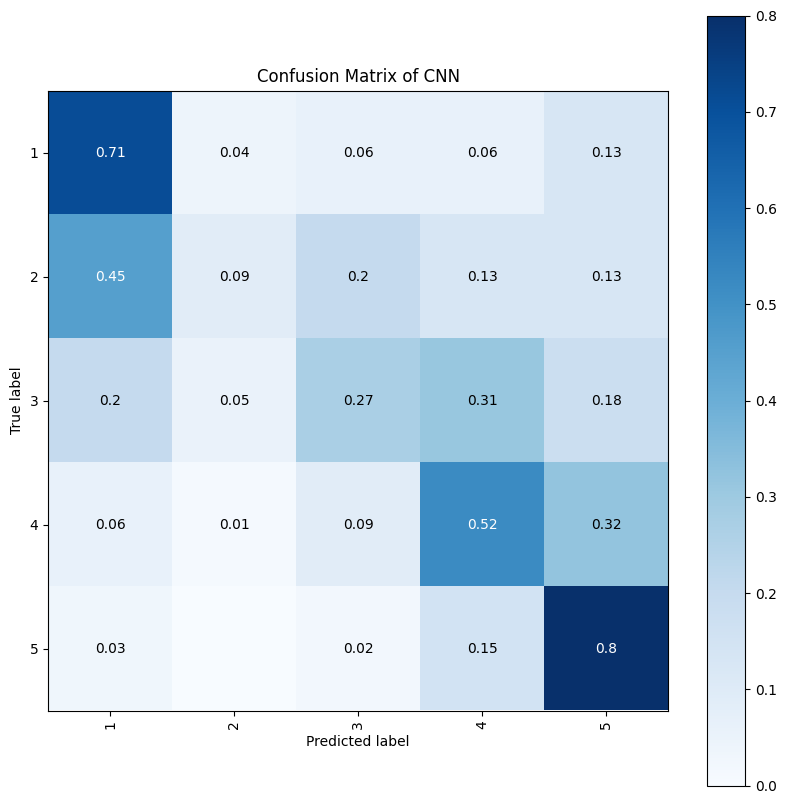

In [ ]:
import scikitplot as skplt
import matplotlib.pyplot as plt
t_l = [i+1 for i in test_l]
pred_l = [i+1 for i in np.argmax(test_preds, axis=1)] 
skplt.metrics.plot_confusion_matrix(t_l, pred_l,
                                    normalize=True,
                                    title="Confusion Matrix of CNN",
                                    hide_zeros=True,
                                    figsize=(10,10), x_tick_rotation=90)
plt.show()

This model more accurately copes with the classification of 5 and 3 star reviews, and the results obtained from the work of the above model with this `Deep CNN` are comparable and differ little in accuracy, regardless of the number of neurons in the convolutional layers. However, this model is much slower and consumes more computing power than the network with `nn.EmbeddingBag`, due to the peculiarities of tokenization.

### Network 3 RNN
`tensorflow`

* In the following example, the pre-trained GloVe model is no longer used, since the correlation of available words based on statistics did not have the expected effect, instead, the possibility of training weights in this layer is also considered.
* Also, to improve the learning process, data in the `tf.data.Dataset` format is used, which simplifies the representation of data in a tensor form


In [ ]:
from sklearn.model_selection import train_test_split
import pyarrow.parquet as pq
import tensorflow as tf

df = pq.read_table('/content/drive/MyDrive/'+
                     'Colab Notebooks/ML/Bonus_t'+
                     'rack/df.parquet.gzip',
                     columns=['star_rating','clean_text'])
df = df.drop_null().to_pandas()
df['length'] = df['clean_text'].str.len()
quantile_9 = df['length'].quantile(0.9)
df = df[df['length'] < quantile_9]
df = df.sort_values(by='star_rating')
df = df.drop(columns='length')
df = df.iloc[:1526278]
df.star_rating = [int(x)-1 for x in df.star_rating]
train, test = train_test_split(df, test_size=0.3, random_state=2018)
train, val = train_test_split(train, test_size=0.2, random_state=195)

In [ ]:
dataset = (tf.data.Dataset.from_tensor_slices(
        (tf.cast(df['clean_text'].values, tf.string),
         tf.cast(df['star_rating'].values, tf.int32))))
train_dataset = (tf.data.Dataset.from_tensor_slices(
        (tf.cast(train['clean_text'].values, tf.string),
         tf.cast(train['star_rating'].values, tf.int32))))
val_dataset = (tf.data.Dataset.from_tensor_slices(
        (tf.cast(val['clean_text'].values, tf.string),
         tf.cast(val['star_rating'].values, tf.int32))))
test_dataset = (
    tf.data.Dataset.from_tensor_slices(
        (
            tf.cast(test['clean_text'].values, tf.string),
            tf.cast(test['star_rating'].values, tf.int32)
        )
    )
)
BUFFER_SIZE = 10000
BATCH_SIZE = 64

train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
train_dataset.element_spec

(TensorSpec(shape=(None,), dtype=tf.string, name=None),
 TensorSpec(shape=(None,), dtype=tf.int32, name=None))

In [ ]:
train_dataset.take(1)

<_TakeDataset element_spec=(TensorSpec(shape=(None,), dtype=tf.string, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [ ]:
for example, label in train_dataset.take(1):
  print('text: ', example.numpy()[:3])
  print('label: ', label.numpy()[:3])

text:  [b' cable work tried everything still luck  waste money time product seller'
 b'three power adapters fill slot power strip  use inexpensive  instantly cut warning tags even ul make trim unobtrusive  th right short length use  ordered another set plus one lights rock band show circuit rather suspecting amp piece equipment dead outlet'
 b' use everyday  love fact  charge ipod iphone time  doc volume control work system remote  think kind defect  works fine']
label:  [0 4 3]


#### Dictionary building and vectorization

In [ ]:
import numpy as np
encoder = tf.keras.layers.TextVectorization()
dataset = dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
with tf.device('GPU'):
    encoder.adapt(dataset.map(lambda text, label: text))
    vocab = np.array(encoder.get_vocabulary())
vocab[:20]

array(['', '[UNK]', 'great', 'sound', 'good', 'one', 'would', 'use',
       'works', 'product', 'work', 'quality', 'well', 'like', 'get', 'tv',
       'price', 'cable', 'time', 'headphones'], dtype='<U213')

In [ ]:
encoded_example = encoder(example)[:3].numpy()
encoded_example

array([[ 642, 2131,  314, 3196,  158,   12,  973,  386, 5042,  812,  399,
         199,  467,  291,   40,  261,  101,  914,  830,   38,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0],
       [   7,   54, 2182,    8,    2,   64,   93,  720, 2068,  710,  180,
          15,  120,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    

In [ ]:
for n in range(3):
  print("Original: ", example[n].numpy())
  print("Round-trip: ", " ".join(vocab[encoded_example[n]]))

Original:  b'totally meets needs receives signal well automatically goes scanning mode outside home area highly recommend anyone looking reliable weather radio'
Round-trip:  totally meets needs receives signal well automatically goes scanning mode outside home area highly recommend anyone looking reliable weather radio                                                          
Original:  b'use new nexus works great long enough allow placement tablet away tv needed'
Round-trip:  use new nexus works great long enough allow placement tablet away tv needed                                                                 
Original:  b'works easy program  battery charger great takes fine tuning get cradle   buy  would'
Round-trip:  works easy program battery charger great takes fine tuning get cradle buy would                                                                 


In [ ]:
for example, label in dataset.take(2):
  print('texts: ', example.numpy()[:3])
  print()
  print('labels: ', label.numpy()[:3])

texts:  [b' would say stars glue holding together falling apart'
 b' adapter work sony vaio duo svd x  tip long adapter stay firmly place  vendor helpful covered shipping unit back refunded money  sale advertised working laptop model svd x  vendor asked send photo sony adapter adapters tips side  side asked measure sony tip  little surprised selling something product know proper specs'
 b'  really buy   perhaps give away  certainly']

labels:  [0 0 0]
texts:  [b'used hook game console computer monitor would detect monitor works fine hooked computer'
 b'  dislike  returned since  updated laptop sorry  could use'
 b'got replacement cable excited plugged music would lower volume itselfwhen tried use buttons  dont work wtf dont trust lastek anymore']

labels:  [0 0 0]


In [ ]:
import gc
gc.collect()
print(len(vocab))

186804


The following model consists of several layers, including a bidirectional layer LSTM[<sup>8<sup/>](https://doi.org/10.1007/978-3-642-24797-2).
- Bidirectional LSTM is a type of Recurrent Neural Network (RNN) that allows the model to look at the input sequence both forward and backward and the output will be combined. This allows the model to capture dependencies in both directions and is achieved by duplicating the first layer of the LSTM in the network so that there are now two layers next to each other. The input sequence is provided as is as input to the first level, and a reverse copy of the input sequence is provided to the second level.
- The LSTM layer itself is a type of RNN that is capable of learning long-term dependencies in serial data. This is achieved by maintaining the state of the cell, which can be updated or reset based on input, and a series of gates that control the flow of information in and out of the cell. Gates include input gates, output gates, and forget gates, which determine how much new input to let into a cell, how much to output, and how much to forget from a previous state, respectively.

In [ ]:
#@title Построение модели RNN
model = tf.keras.Sequential([
    encoder,
    tf.keras.layers.Embedding(
        input_dim=len(encoder.get_vocabulary()),
        output_dim=64,
        # Use masking to handle the variable sequence lengths
        mask_zero=True),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(5, activation='softmax')
])

print([layer.supports_masking for layer in model.layers])

[False, True, True, True, True]


In [ ]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 text_vectorization_1 (TextV  (None, None)             0         
 ectorization)                                                   
                                                                 
 embedding_4 (Embedding)     (None, None, 64)          11955456  
                                                                 
 bidirectional_7 (Bidirectio  (None, 128)              66048     
 nal)                                                            
                                                                 
 dense_8 (Dense)             (None, 64)                8256      
                                                                 
 dense_9 (Dense)             (None, 5)                 325       
                                                                 
Total params: 12,030,085
Trainable params: 12,030,085


In [ ]:
sample_text = ('I like it. The animation and the graphics '
               'were out of this world.')
with tf.device('GPU:0'):predictions = model.predict(np.array([sample_text]))
print(f'output: {predictions[0]},\n Star: {predictions.argmax(1)}')

1/1 [==============================] - 2s 2s/step
output: [0.20000887 0.20075472 0.19854458 0.199559   0.20113285],
 Star: [4]


In [ ]:
padding = "the " * 2000
predictions = model.predict(np.array([sample_text, padding]))
print(predictions[0])  # same result with padding

1/1 [==============================] - 0s 62ms/step
[0.20000887 0.20075472 0.19854458 0.199559   0.20113285]


In [ ]:
from tensorflow.keras.metrics import categorical_accuracy
from tensorflow.keras.utils import to_categorical
train_ = np.asarray(train.clean_text.to_list())
train_l = to_categorical(np.asarray(train.star_rating.to_list()))
val_ = np.asarray(val.clean_text.to_list())
val_l = to_categorical(np.asarray(val.star_rating.to_list()))

The `to_categorical` function is used to convert star ratings to `one-hot encoding` vectors. The variables `train_` and `val_` contain text data, and `train_l` and `val_l` contain star ratings encoded with `one-hot encoding`, i.e. a review with a rating of `5` will correspond to the vector `[0, 0, 0 , 0, 1]`.

In [ ]:
train_dataset = (tf.data.Dataset.from_tensor_slices(
        (tf.cast(train_, tf.string),
         tf.cast(train_l, tf.int32))))
val_dataset = (tf.data.Dataset.from_tensor_slices(
        (tf.cast(val_, tf.string),
         tf.cast(val_l, tf.int32))))
BUFFER_SIZE = 10000
BATCH_SIZE = 64

train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
train_dataset.element_spec

(TensorSpec(shape=(None,), dtype=tf.string, name=None),
 TensorSpec(shape=(None, 5), dtype=tf.int32, name=None))

##### <h2> Training </h2>

For multi-class classification over 5 classes using RNN, several loss functions and optimizers can be used.

- For multiclass classification, the relevant loss functions include categorical cross entropy, sparse categorical cross entropy, and Kullback-Leibler divergence.
- Categorical cross entropy is used when the target is `one-hot encoded`, while sparse categorical cross entropy is used when the target is integers.
- The Kullback-Leibler divergence is a measure of how far two probability distributions differ from each other.

- For sparse categorical cross-entropy, categorical cross-entropy and Kullback-Leibler divergence, the output layer must have a `softmax` activation function and a number of nodes equal to the number of classes.

- Popular optimizers for RNN models include `SGD`, `Adam` and `RMSprop` Stochastic Gradient Descent
- `SGD` is a simple optimizer that updates the weights based on the gradient of the loss function.
— `Adam` is a popular optimizer that adapts the learning rate based on the first and second moments of the gradients.
- `RMSprop` is an optimizer that uses the gradient squared moving average to scale the learning rate.

In [ ]:
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(1e-4),
              metrics=['categorical_accuracy'])

In [ ]:
with tf.device('GPU'):
    history = model.fit(train_dataset, epochs=10,
                    validation_data=val_dataset,
                    validation_steps=30)

Epoch 1/10
13355/13355 [==============================] - 367s 27ms/step - loss: 0.9280 - categorical_accuracy: 0.6211 - val_loss: 0.9169 - val_categorical_accuracy: 0.6328
Epoch 2/10
13355/13355 [==============================] - 297s 22ms/step - loss: 0.8995 - categorical_accuracy: 0.6337 - val_loss: 0.9108 - val_categorical_accuracy: 0.6297
Epoch 3/10
13355/13355 [==============================] - 292s 22ms/step - loss: 0.8773 - categorical_accuracy: 0.6436 - val_loss: 0.9109 - val_categorical_accuracy: 0.6260
Epoch 4/10
13355/13355 [==============================] - 350s 26ms/step - loss: 0.8572 - categorical_accuracy: 0.6534 - val_loss: 0.9146 - val_categorical_accuracy: 0.6187
Epoch 5/10
13355/13355 [==============================] - 287s 21ms/step - loss: 0.8377 - categorical_accuracy: 0.6625 - val_loss: 0.9281 - val_categorical_accuracy: 0.6240
Epoch 6/10
13355/13355 [==============================] - 303s 23ms/step - loss: 0.8183 - categorical_accuracy: 0.6718 - val_loss: 0.93

In [ ]:
model.save_weights('/content/drive/MyDrive/Colab Notebooks/ML/Bonus_track/tf_RNN_checkpoint', save_format='tf')
model.save('/content/drive/MyDrive/Colab Notebooks/ML/Bonus_track/RNN_06_tf')

##### <h3> Results </h3>

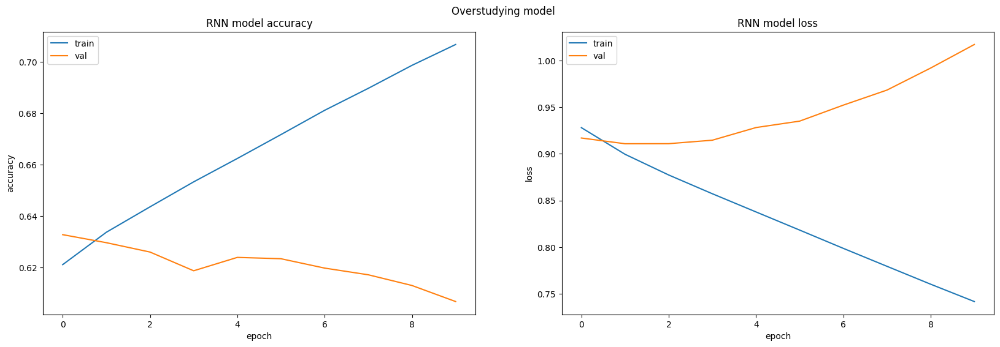

In [ ]:
plt.figure(figsize=(20, 6))
plt.suptitle('Overfitting model',y=0.95) 
plt.subplot(1, 2, 1)
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('RNN model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('RNN model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

From the training history of this recurrent network, it can be seen that the model predicts classes better for the training set and less and less accurate for the validation one, that is, `overfitting` on the training data, however, the generalizing ability of the model remains, which can be seen from the accuracy value for the test set.

Overfitting is a fundamental problem in deep neural networks that is related to continuous gradient updating and scale sensitivity to cross entropy loss.

In [ ]:
from sklearn.metrics import accuracy_score, classification_report

test_ = np.asarray(test.clean_text.to_list())
test_l = np.asarray(test.star_rating.to_list())
with tf.device('GPU'):
    test_pred = model.predict(test_)

14309/14309 [==============================] - 184s 13ms/step


In [ ]:
gc.collect()

4131

In [ ]:
print("Test  Accuracy : {}".format(accuracy_score(test_l, np.argmax(test_pred, axis=1))))
print(classification_report(test_l, np.argmax(test_pred, axis=1)))

Test  Accuracy : 0.6022092931834264
              precision    recall  f1-score   support

           0       0.66      0.77      0.71     94255
           1       0.33      0.21      0.25     45367
           2       0.38      0.28      0.32     59446
           3       0.58      0.62      0.60    129430
           4       0.71      0.75      0.73    129386

    accuracy                           0.60    457884
   macro avg       0.53      0.53      0.52    457884
weighted avg       0.58      0.60      0.59    457884



In [ ]:
%pip install scikit-plot -q

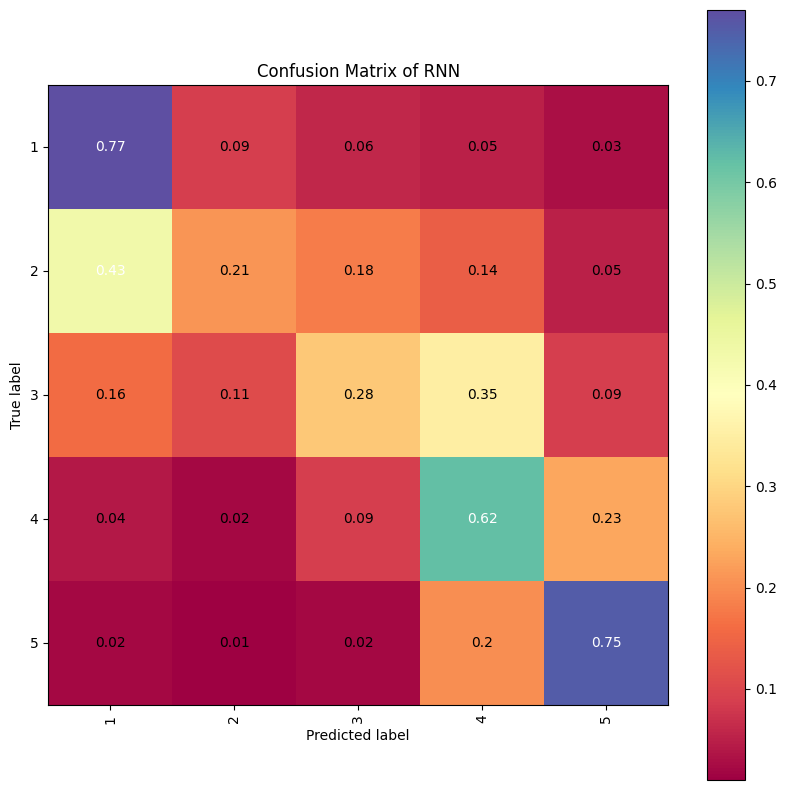

In [ ]:
import scikitplot as skplt
import matplotlib.pyplot as plt
t_l = [i+1 for i in test_l]
pred_l = [i+1 for i in np.argmax(test_pred, axis=1)] 
skplt.metrics.plot_confusion_matrix(t_l, pred_l,
                                    normalize=True,
                                    title="Confusion Matrix of RNN",
                                    hide_zeros=True,
                                    cmap='Spectral',
                                    figsize=(10,10), x_tick_rotation=90)
plt.show()

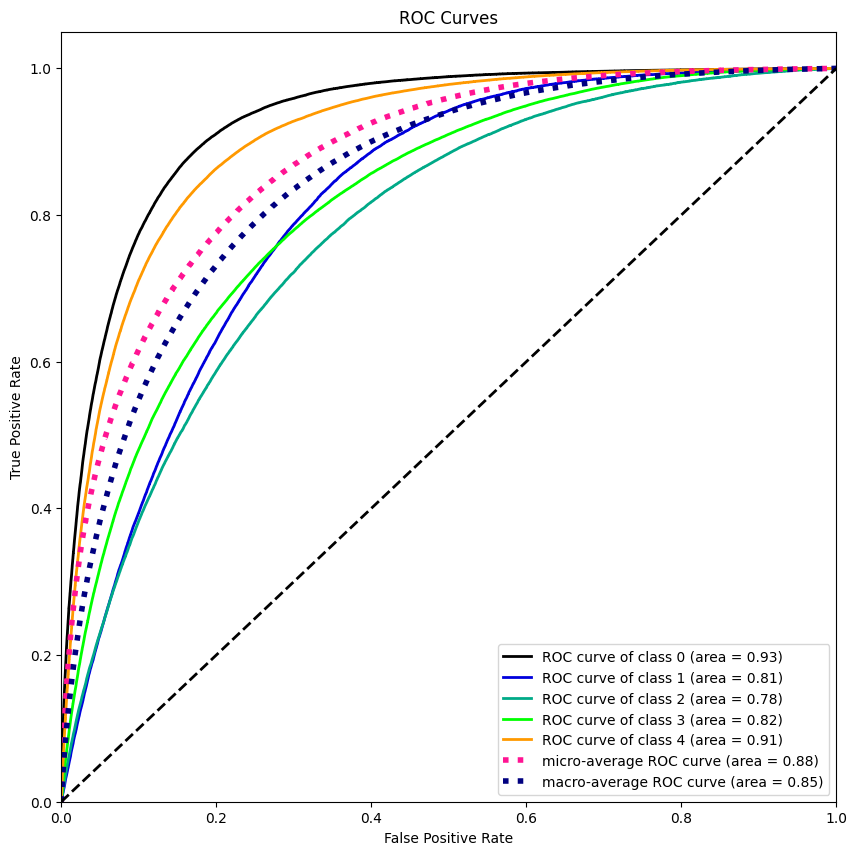

In [ ]:
skplt.metrics.plot_roc(test_l, test_pred,figsize=(10,10))
plt.show()

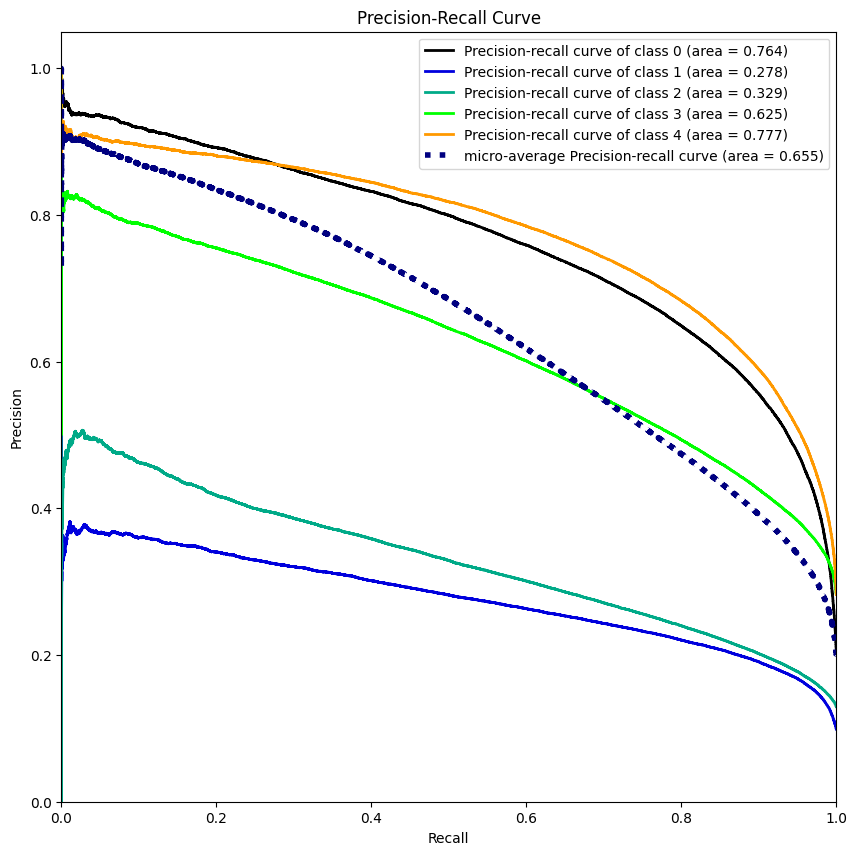

In [ ]:
skplt.metrics.plot_precision_recall(test_l,test_pred, figsize=(10,10))
plt.show()

-----
According to the `ROC-curve` graph, it can be seen that the constructed model also does not cope well with the classification of 2- and 3-star reviews, however, under the condition of re-training, the results of the correct correlation of classes are higher than those of the above networks with `EmbeddingBag` and ` Conv1D` in layers. Also, not using the weights from the pre-trained Glove model for the `Embedding` layer and training them as well was the right decision.


### Network 3.5 RNN
`tensorflow`


From the consideration of the case above, with the retrained model, it was decided to add additional layers, since the choice of other optimizers or loss functions, as well as an increase in the number of neurons, did not lead to improved results. Next, we consider a similar version of a deep recurrent network.

In [ ]:
from sklearn.model_selection import train_test_split
import pyarrow.parquet as pq
import tensorflow as tf

df = pq.read_table('/content/drive/MyDrive/'+
                     'Colab Notebooks/ML/Bonus_t'+
                     'rack/df.parquet.gzip',
                     columns=['star_rating','clean_text'])
df = df.drop_null().to_pandas()
df['length'] = df['clean_text'].str.len()
quantile_9 = df['length'].quantile(0.9)
df = df[df['length'] < quantile_9]
df = df.sort_values(by='star_rating')
df = df.drop(columns='length')
df = df.iloc[:1526278]
df.star_rating = [int(x)-1 for x in df.star_rating]
train, test = train_test_split(df, test_size=0.3, random_state=2018)

In [ ]:
dataset = (tf.data.Dataset.from_tensor_slices(
        (tf.cast(df['clean_text'].values, tf.string),
         tf.cast(df['star_rating'].values, tf.int32))))
BUFFER_SIZE = 10000
BATCH_SIZE = 64

dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
dataset.element_spec

(TensorSpec(shape=(None,), dtype=tf.string, name=None),
 TensorSpec(shape=(None,), dtype=tf.int32, name=None))

In [ ]:
import numpy as np
VOCAB_SIZE = 3000
encoder = tf.keras.layers.TextVectorization(
    max_tokens=VOCAB_SIZE)
with tf.device('GPU'):
    encoder.adapt(dataset.map(lambda text, label: text))
    vocab = np.array(encoder.get_vocabulary())
vocab[:20]

array(['', '[UNK]', 'great', 'sound', 'good', 'one', 'would', 'use',
       'works', 'product', 'work', 'quality', 'well', 'like', 'get', 'tv',
       'price', 'cable', 'time', 'headphones'], dtype='<U15')

In [ ]:
import gc
gc.collect()
print(len(vocab))

3000


In [ ]:
from tensorflow.keras.metrics import categorical_accuracy
from tensorflow.keras.utils import to_categorical
train_ = np.asarray(train.clean_text.to_list())
train_l = to_categorical(np.asarray(train.star_rating.to_list()))
test_ = np.asarray(test.clean_text.to_list())
test_l = to_categorical(np.asarray(test.star_rating.to_list()))

In [ ]:
train_dataset = (tf.data.Dataset.from_tensor_slices(
        (tf.cast(train_, tf.string),
         tf.cast(train_l, tf.int32))))
test_dataset = (tf.data.Dataset.from_tensor_slices(
        (tf.cast(test_, tf.string),
         tf.cast(test_l, tf.int32))))
BUFFER_SIZE = 10000
BATCH_SIZE = 64

train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
train_dataset.element_spec

(TensorSpec(shape=(None,), dtype=tf.string, name=None),
 TensorSpec(shape=(None, 5), dtype=tf.int32, name=None))

#### Model building

In [ ]:
model = tf.keras.Sequential([
    encoder,
    tf.keras.layers.Embedding(len(encoder.get_vocabulary()), 128, mask_zero=True),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128,  return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(5,activation='softmax')
])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 text_vectorization (TextVec  (None, None)             0         
 torization)                                                     
                                                                 
 embedding (Embedding)       (None, None, 128)         384000    
                                                                 
 bidirectional (Bidirectiona  (None, None, 256)        263168    
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 128)              164352    
 nal)                                                            
                                                                 
 dense (Dense)               (None, 128)               16512     
                                                        

In [ ]:
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
              optimizer=tf.keras.optimizers.experimental.Adam(learning_rate=3e-4),
              metrics=[categorical_accuracy])

#### Training

In [ ]:
with tf.device('GPU'):
    history = model.fit(train_dataset, epochs=5,
                    validation_data=test_dataset,
                    validation_steps=20)

Epoch 1/5
 7441/16694 [============>.................] - ETA: 6:25 - loss: 1.0222 - categorical_accuracy: 0.5812

In [ ]:
with tf.device('GPU'):
    history = model.fit(train_dataset, epochs=5,
                    validation_data=test_dataset,
                    validation_steps=10)

Epoch 1/5
16694/16694 [==============================] - 656s 38ms/step - loss: 0.9868 - categorical_accuracy: 0.5977 - val_loss: 0.9262 - val_categorical_accuracy: 0.6000
Epoch 2/5
16694/16694 [==============================] - 580s 35ms/step - loss: 0.9262 - categorical_accuracy: 0.6228 - val_loss: 0.9015 - val_categorical_accuracy: 0.6250
Epoch 3/5
16694/16694 [==============================] - 556s 33ms/step - loss: 0.8988 - categorical_accuracy: 0.6332 - val_loss: 0.8815 - val_categorical_accuracy: 0.6211
Epoch 4/5
16694/16694 [==============================] - 540s 32ms/step - loss: 0.8779 - categorical_accuracy: 0.6411 - val_loss: 0.8876 - val_categorical_accuracy: 0.6141
Epoch 5/5
16694/16694 [==============================] - 520s 31ms/step - loss: 0.8606 - categorical_accuracy: 0.6478 - val_loss: 0.8774 - val_categorical_accuracy: 0.6336


In [ ]:
model.save_weights('/content/drive/MyDrive/tf_RNN_checkpoint_01', save_format='tf')
# model.save('/content/drive/MyDrive/RNN_06_tf_01')

In [ ]:
%pip install scikit-plot -q

In [ ]:
from sklearn.metrics import accuracy_score, classification_report

test_ = np.asarray(test.clean_text.to_list())
test_l = np.asarray(test.star_rating.to_list())
with tf.device('GPU'):
    test_pred = model.predict(test_)

14309/14309 [==============================] - 179s 12ms/step


#### Results

In [ ]:
print("Test  Accuracy : {}".format(accuracy_score(test_l, np.argmax(test_pred, axis=1))))
print(classification_report(test_l, np.argmax(test_pred, axis=1)))

Test  Accuracy : 0.63597548724131
              precision    recall  f1-score   support

           0       0.67      0.83      0.74     94255
           1       0.42      0.13      0.19     45367
           2       0.43      0.32      0.37     59446
           3       0.60      0.70      0.64    129430
           4       0.74      0.76      0.75    129386

    accuracy                           0.64    457884
   macro avg       0.57      0.55      0.54    457884
weighted avg       0.61      0.64      0.61    457884



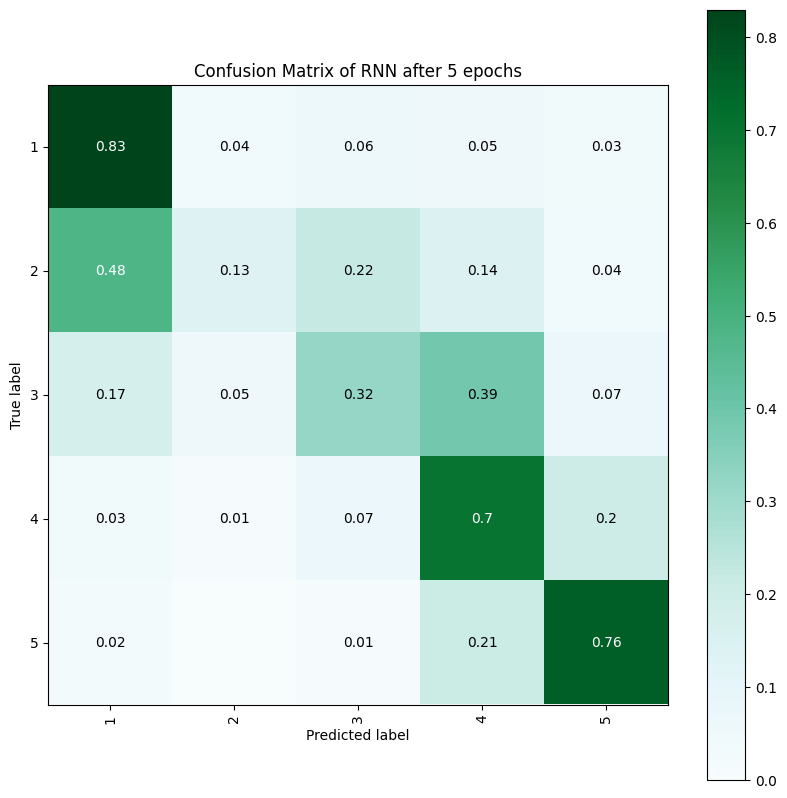

In [ ]:
import scikitplot as skplt
import matplotlib.pyplot as plt
t_l = [i+1 for i in test_l]
pred_l = [i+1 for i in np.argmax(test_pred, axis=1)] 
skplt.metrics.plot_confusion_matrix(t_l, pred_l,
                                    normalize=True,
                                    title="Confusion Matrix of RNN after 5 epochs",
                                    hide_zeros=True,
                                    cmap='BuGn',
                                    figsize=(10,10), x_tick_rotation=90)
plt.show()

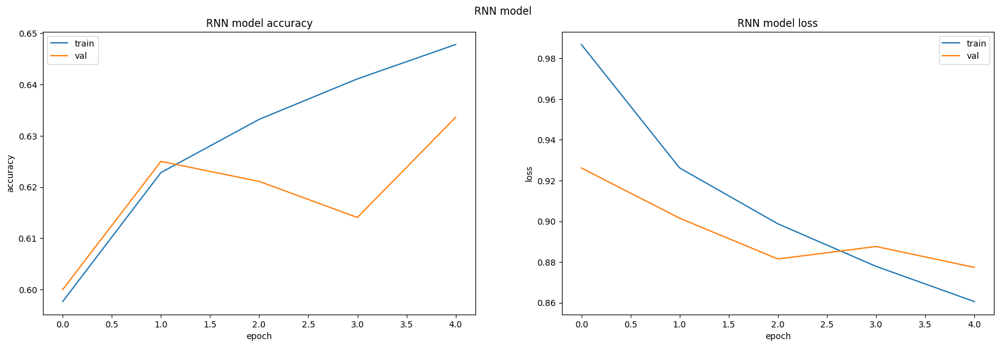

In [ ]:
plt.figure(figsize=(20, 6))
plt.suptitle('RNN model',y=0.95)
plt.subplot(1, 2, 1)
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('RNN model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('RNN model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

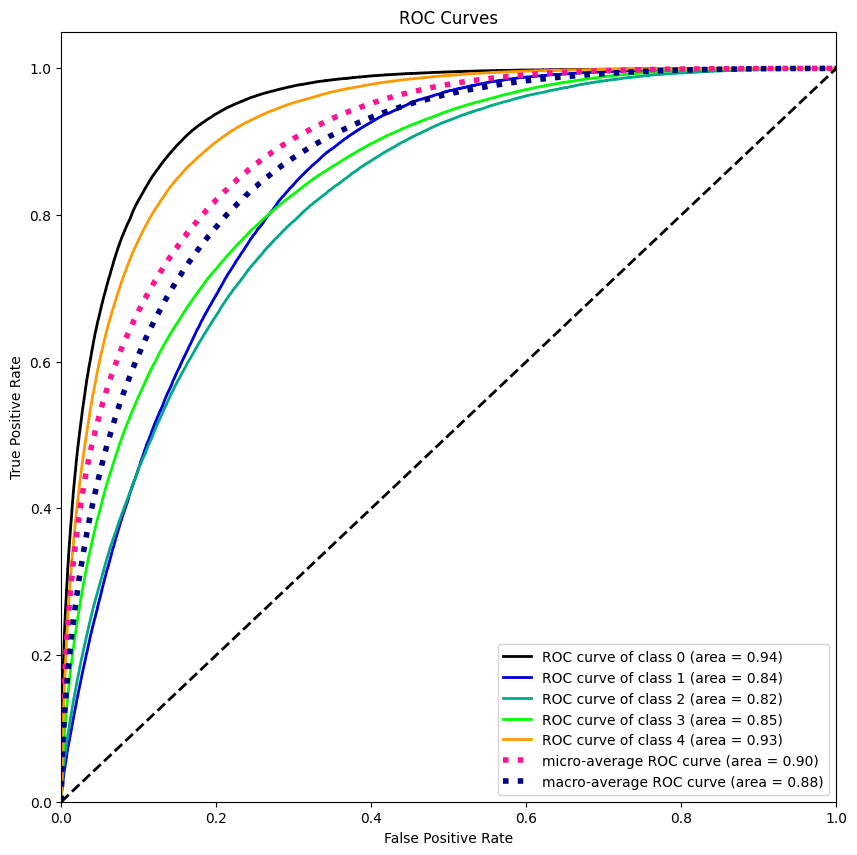

In [ ]:
skplt.metrics.plot_roc(test_l, test_pred,figsize=(10,10))
plt.show()

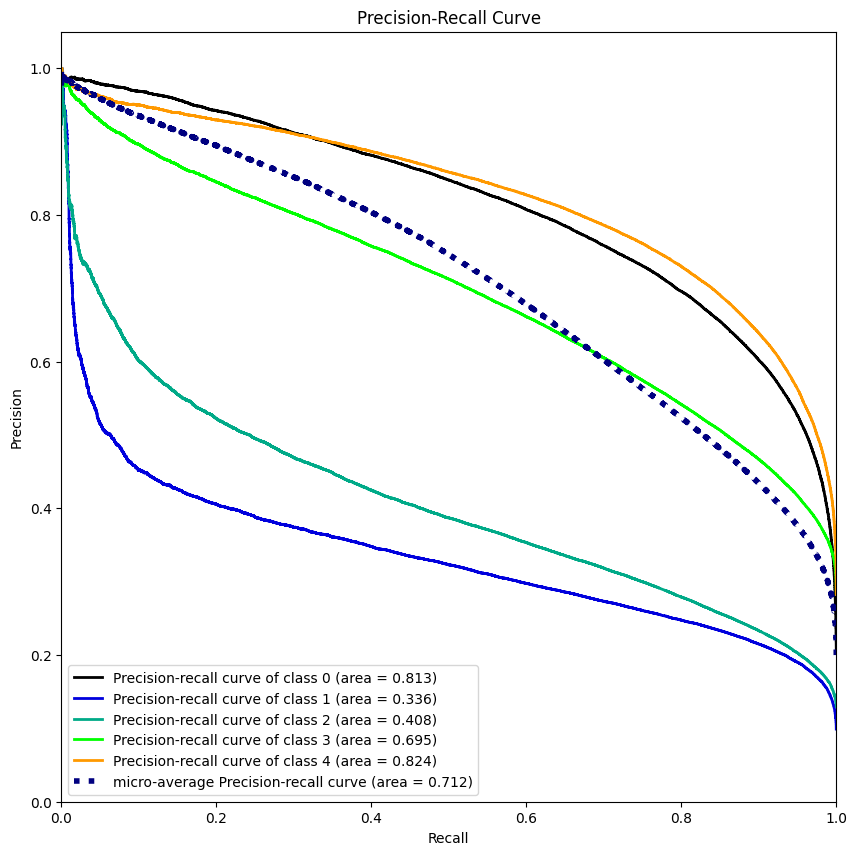

In [ ]:
skplt.metrics.plot_precision_recall(test_l,test_pred, figsize=(10,10))
plt.show()

-----

The model showed 63.6% accuracy on a training set of 457K reviews, which is the best result available for this sample so far.

The current configuration has been applied to prevent overfitting, although the architectural complexity of the model may cause the model to overfit. Also
`Dropout` layer: a regularization method that randomly drops (or removes) some neurons in a neural network during training. This technique helps prevent overfitting by reducing neuron interdependence and forcing the network to learn more robust features.

When changing the learning rate or choosing another optimizer, finding the minimum of the loss function, this configuration and the number of epochs, in our opinion, is optimal.

In this case, the complication of the model architecture led to better results, but further training or complication of the model and the choice of other optimizer and loss function did not lead to the desired result. What can also be explained by the peculiarity of the semantics of reviews, since such a specific area as electronics was chosen.


Based on the results, this model of the above proposed classifies all reviews in the best way, however, in order to achieve greater accuracy, it was decided to consider other models, which will be added later.